# Single-View Geometry (Python)

## Usage
This code snippet provides an overall code structure and some interactive plot interfaces for the *Single-View Geometry* section of Assignment 3. In [main function](#Main-function), we outline the required functionalities step by step. Some of the functions which involves interactive plots are already provided, but [the rest](#Your-implementation) are left for you to implement.

## Package installation
- You will need [GUI backend](https://matplotlib.org/faq/usage_faq.html#what-is-a-backend) to enable interactive plots in `matplotlib`.
- In this code, we use `tkinter` package. Installation instruction can be found [here](https://anaconda.org/anaconda/tk).

# Common imports

In [31]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import cv2
import os

from PIL import Image
import pickle

In [32]:
# %matplotlib inline
matplotlib.use('TkAgg')

# Provided functions

In [33]:
def get_input_lines(im, min_lines=3):
    """
    Allows user to input line segments; computes centers and directions.
    Inputs:
        im: np.ndarray of shape (height, width, 3)
        min_lines: minimum number of lines required
    Returns:
        n: number of lines from input
        lines: np.ndarray of shape (3, n)
            where each column denotes the parameters of the line equation
        centers: np.ndarray of shape (3, n)
            where each column denotes the homogeneous coordinates of the centers
    """
    n = 0
    lines = np.zeros((3, 0))
    centers = np.zeros((3, 0))

    plt.figure()
    plt.axis('off')
    plt.imshow(im)
    print(f'Set at least {min_lines} lines to compute vanishing point')
    print(f'The delete and backspace keys act like right clicking')
    print(f'The enter key acts like middle clicking')
    while True:
        print('Click the two endpoints, use the right button (delete and backspace keys) to undo, and use the middle button to stop input')
        clicked = plt.ginput(2, timeout=0, show_clicks=True)
        if not clicked or len(clicked) < 2:
            if n < min_lines:
                print(f'Need at least {min_lines} lines, you have {n} now')
                continue
            else:
                # Stop getting lines if number of lines is enough
                break

        # Unpack user inputs and save as homogeneous coordinates
        pt1 = np.array([clicked[0][0], clicked[0][1], 1])
        pt2 = np.array([clicked[1][0], clicked[1][1], 1])
        # Get line equation using cross product
        # Line equation: line[0] * x + line[1] * y + line[2] = 0
        line = np.cross(pt1, pt2)
        lines = np.append(lines, line.reshape((3, 1)), axis=1)
        # Get center coordinate of the line segment
        center = (pt1 + pt2) / 2
        centers = np.append(centers, center.reshape((3, 1)), axis=1)

        # Plot line segment
        plt.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], color='b')

        n += 1

    return n, lines, centers

In [34]:
def plot_lines_and_vp(ax, im, lines, vp):
    """
    Plots user-input lines and the calculated vanishing point.
    Inputs:
        im: np.ndarray of shape (height, width, 3)
        lines: np.ndarray of shape (3, n)
            where each column denotes the parameters of the line equation
        vp: np.ndarray of shape (3, )
    """
    bx1 = min(1, vp[0] / vp[2]) - 10
    bx2 = max(im.shape[1], vp[0] / vp[2]) + 10
    by1 = min(1, vp[1] / vp[2]) - 10
    by2 = max(im.shape[0], vp[1] / vp[2]) + 10
    
    ax.imshow(im)
    for i in range(lines.shape[1]):
        if lines[0, i] < lines[1, i]:
            pt1 = np.cross(np.array([1, 0, -bx1]), lines[:, i])
            pt2 = np.cross(np.array([1, 0, -bx2]), lines[:, i])
        else:
            pt1 = np.cross(np.array([0, 1, -by1]), lines[:, i])
            pt2 = np.cross(np.array([0, 1, -by2]), lines[:, i])
        pt1 = pt1 / pt1[2]
        pt2 = pt2 / pt2[2]
        ax.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], 'g')

    ax.plot(vp[0] / vp[2], vp[1] / vp[2], 'ro')
    ax.set_xlim([bx1, bx2])
    ax.set_ylim([by2, by1])

# Your implementation

In [35]:
def get_vanishing_point(n, lines):
    """
    Solves for the vanishing point using the user-input lines.
    """
    # <YOUR CODE>
    M = np.zeros((3, 3))
    for i in range(n):
        M += lines[:, i:i+1] @ lines[:, i:i+1].T
    val, vec = np.linalg.eig(M)
    vp = vec[:, np.argmin(val)]
    vp /= vp[-1]
    return vp

In [36]:
def get_horizon_line(vp1, vp2):
    """
    Calculates the ground horizon line.
    """
    # <YOUR CODE>
    def symbol(num):
        if num < 0:
            return f'{num}'
        else:
            return f'+ {num}'
    dirn = np.cross(vp1, vp2)
    dirn = dirn / np.linalg.norm(dirn[:2])
    print(f'Horizon line equation is: {symbol(dirn[0])}x {symbol(dirn[1])}y {symbol(dirn[2])} = 0')
    return dirn

In [37]:
def plot_horizon_line(vp1, vp2, im, ax):
    """
    Plots the horizon line.
    """
    # <YOUR CODE>
    pt1 = (vp1 / vp1[-1])[:2]
    pt2 = (vp2 / vp2[-1])[:2]
    ax.imshow(im)
    ax.axline(pt1, pt2, c='g')
    ax.plot(pt1[0], pt1[1], 'ro')
    ax.plot(pt2[0], pt2[1], 'ro')

In [38]:
def get_camera_parameters(vpts):
    """
    Computes the camera parameters. Hint: The SymPy package is suitable for this.
    """
    # <YOUR CODE>
    vpts /= vpts[-1, :]
    vp1 = vpts[:, 0]
    vp2 = vpts[:, 1]
    vp3 = vpts[:, 2]
    A = np.zeros((3, 3))
    A[0, :] = vp1 + vp2
    A[1, :] = vp1 + vp3
    A[2, :] = vp2 + vp3
    b = np.zeros((3, ))
    b[0] = vp1 @ vp2
    b[1] = vp1 @ vp3
    b[2] = vp2 @ vp3
    b -= 1
    px, py, k = np.linalg.inv(A) @ b
    f = -2 * k - px**2 - py**2
    return f, px, py, np.array([[f, 0, px], [0, f, py], [0, 0, 1]])

In [39]:
def get_rotation_matrix(vpts, K):
    """
    Computes the rotation matrix using the camera parameters.
    """
    # <YOUR CODE>
    R = np.zeros((3, 3))
    Kinv = np.linalg.inv(K)
    for i in range(3):
        ri = Kinv @ vpts[:, i]
        R[:, i] = ri / np.linalg.norm(ri)
    return R

In [40]:
def get_homography(R, K):
    """
    Compute homography for transforming the image into fronto-parallel 
    views along the different axes.
    """
    # <YOUR CODE>
    return K @ R @ np.linalg.inv(K)

# Main function

In [41]:
im = np.asarray(Image.open('./eceb.jpg'))

# Also loads the vanishing line data if it exists in data.pickle file. 
# data.pickle is written using snippet in the next cell.
if os.path.exists('./data.pickle'):
    with open('./data.pickle', 'rb') as f:
        all_n, all_lines, all_centers = pickle.load(f)
    num_vpts = 3

Getting vanishing point 0
Set at least 3 lines to compute vanishing point
The delete and backspace keys act like right clicking
The enter key acts like middle clicking
Click the two endpoints, use the right button (delete and backspace keys) to undo, and use the middle button to stop input
Click the two endpoints, use the right button (delete and backspace keys) to undo, and use the middle button to stop input
Click the two endpoints, use the right button (delete and backspace keys) to undo, and use the middle button to stop input
Click the two endpoints, use the right button (delete and backspace keys) to undo, and use the middle button to stop input
Click the two endpoints, use the right button (delete and backspace keys) to undo, and use the middle button to stop input
Getting vanishing point 1
Set at least 3 lines to compute vanishing point
The delete and backspace keys act like right clicking
The enter key acts like middle clicking
Click the two endpoints, use the right button (de

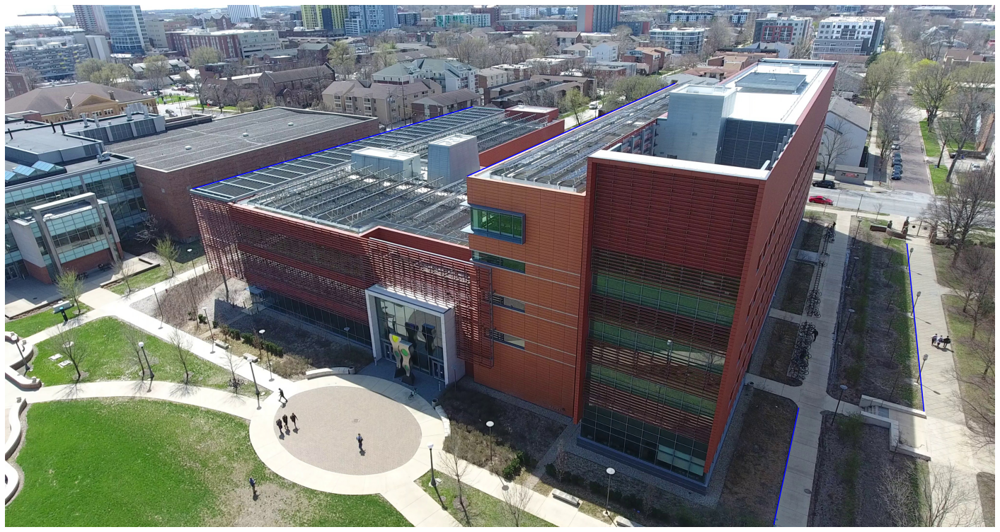

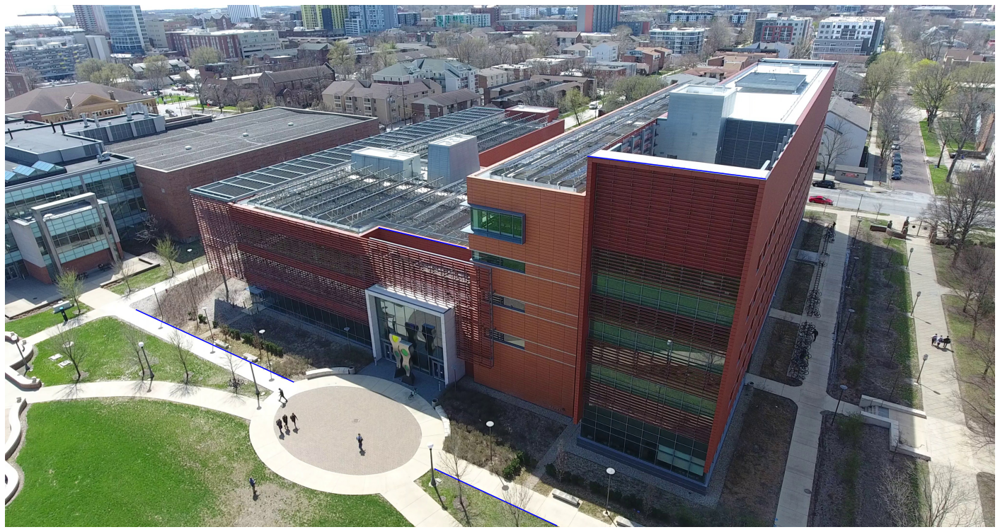

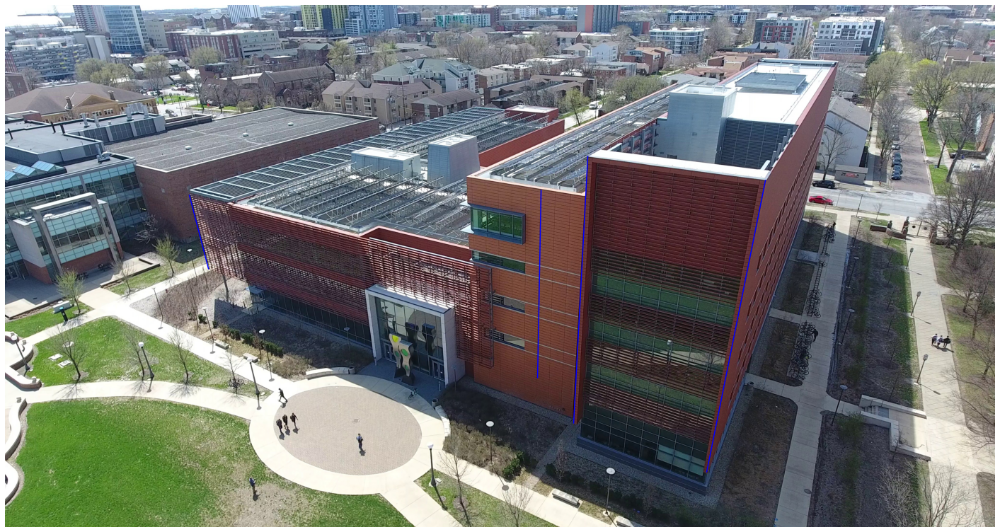

In [53]:
# Click and save the line data for vanishing points. This snippet 
# opens up an interface for selecting points and writes them to 
# data.pickle file. The file is over-written.

num_vpts = 3
all_n, all_lines, all_centers = [], [], []

for i in range(num_vpts):
    print(f'Getting vanishing point {i}')
    
    # Get at least three lines from user input
    n_i, lines_i, centers_i = get_input_lines(im)
    all_n.append(n_i)
    all_lines.append(lines_i)
    all_centers.append(centers_i)

with open('data.pickle', 'wb') as f:
    pickle.dump([all_n, all_lines, all_centers], f)

Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 814, in callit
    func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\_backend_tk.py", line 253, in idle_draw
    self.draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_tkagg.py", line 9, in draw
    super(FigureCanvasTkAgg, self).draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_agg.py", line 407, in draw
    self.figure.draw(self.renderer)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backend_bases.py", line 1544, in _draw
    def _draw(renderer): raise Done(renderer)
matplotlib.backend_bases._get_renderer.<locals>.Done: <matplotlib.backends.backend_agg.RendererAgg object at 0x0000022

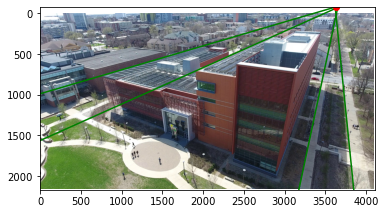

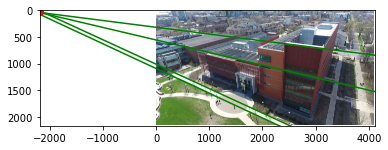

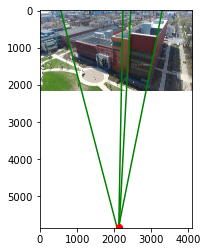

In [42]:
# Part (1)
# Computing vanishing points for each of the directions
vpts = np.zeros((3, num_vpts))

for i in range(num_vpts):
    fig = plt.figure(); ax = fig.gca()
    
    # <YOUR CODE> Solve for vanishing point
    vpts[:, i] = get_vanishing_point(all_n[i], all_lines[i])
    
    # Plot the lines and the vanishing point
    plot_lines_and_vp(ax, im, all_lines[i], vpts[:, i])
    fig.savefig('Q3_vp{:d}.pdf'.format(i), bbox_inches='tight')

Horizon line equation is: -0.01915645400809732x -0.9998164982984806y -2.8323838147337392 = 0


Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 814, in callit
    func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\_backend_tk.py", line 253, in idle_draw
    self.draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_tkagg.py", line 9, in draw
    super(FigureCanvasTkAgg, self).draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_agg.py", line 407, in draw
    self.figure.draw(self.renderer)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backend_bases.py", line 1544, in _draw
    def _draw(renderer): raise Done(renderer)
matplotlib.backend_bases._get_renderer.<locals>.Done: <matplotlib.backends.backend_agg.RendererAgg object at 0x0000022

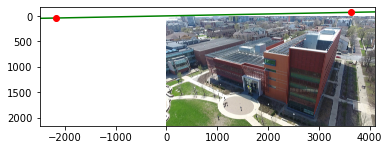

In [43]:
# Part (2) Computing and plotting the horizon
# <YOUR CODE> Get the ground horizon line
horizon_line = get_horizon_line(vpts[:, 0], vpts[:, 1])

# <YOUR CODE> Plot the ground horizon line
fig = plt.figure(); ax = fig.gca()
plot_horizon_line(vpts[:, 0], vpts[:, 1], im, ax)
fig.savefig('Q3_horizon.png', bbox_inches='tight')

In [44]:
# Part (3) Computing Camera Parameters
# <YOUR CODE> Solve for the camera parameters (f, u, v)
f, u, v, K = get_camera_parameters(vpts)
print(u, v, f, K)

2031.4990064180001 1115.835950412643 5468415.895242676 [[5.46841590e+06 0.00000000e+00 2.03149901e+03]
 [0.00000000e+00 5.46841590e+06 1.11583595e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [66]:
# Part (4) Computing Rotation Matrices
# <YOUR CODE> Solve for the rotation matrix
R = get_rotation_matrix(vpts, K)
print(R)

[[ 2.93162839e-04 -7.69755587e-04  1.65515635e-05]
 [-2.17303933e-04 -1.96938395e-04  8.63861668e-04]
 [ 9.99999933e-01  9.99999684e-01  9.99999627e-01]]


In [74]:
homo = get_homography(R, K)

array([[ 6.64659614e-04, -3.98258904e-04,  2.12110322e+03],
       [-1.32529065e-05,  7.11258046e-06,  5.83980940e+03],
       [ 1.82868303e-07,  1.82868257e-07,  9.99424079e-01]])

In [94]:
np.linalg.inv(homo)

array([[ 9.27638073e+02, -6.87251958e+02,  2.04698324e+06],
       [-9.45436940e+02, -2.41696922e+02,  3.41880225e+06],
       [ 3.25668111e-06,  1.69973185e-04,  4.81517658e-04]])

In [95]:
get_homography(np.linalg.inv(R), K)

array([[ 9.27638073e+02, -6.87251958e+02,  2.04698324e+06],
       [-9.45436940e+02, -2.41696922e+02,  3.41880225e+06],
       [ 3.25668111e-06,  1.69973185e-04,  4.81517658e-04]])

# Extra Credit

In [105]:
from skimage import feature, color, transform, io
import numpy as np
import logging


def compute_edgelets(image, sigma=3):
    """Create edgelets as in the paper.
    Uses canny edge detection and then finds (small) lines using probabilstic
    hough transform as edgelets.
    Parameters
    ----------
    image: ndarray
        Image for which edgelets are to be computed.
    sigma: float
        Smoothing to be used for canny edge detection.
    Returns
    -------
    locations: ndarray of shape (n_edgelets, 2)
        Locations of each of the edgelets.
    directions: ndarray of shape (n_edgelets, 2)
        Direction of the edge (tangent) at each of the edgelet.
    strengths: ndarray of shape (n_edgelets,)
        Length of the line segments detected for the edgelet.
    """
    gray_img = color.rgb2gray(image)
    edges = feature.canny(gray_img, sigma)
    lines = transform.probabilistic_hough_line(edges, line_length=3,
                                               line_gap=2)

    locations = []
    directions = []
    strengths = []

    for p0, p1 in lines:
        p0, p1 = np.array(p0), np.array(p1)
        locations.append((p0 + p1) / 2)
        directions.append(p1 - p0)
        strengths.append(np.linalg.norm(p1 - p0))

    # convert to numpy arrays and normalize
    locations = np.array(locations)
    directions = np.array(directions)
    strengths = np.array(strengths)

    directions = np.array(directions) / \
        np.linalg.norm(directions, axis=1)[:, np.newaxis]

    return (locations, directions, strengths)


def edgelet_lines(edgelets):
    """Compute lines in homogenous system for edglets.
    Parameters
    ----------
    edgelets: tuple of ndarrays
        (locations, directions, strengths) as computed by `compute_edgelets`.
    Returns
    -------
    lines: ndarray of shape (n_edgelets, 3)
        Lines at each of edgelet locations in homogenous system.
    """
    locations, directions, _ = edgelets
    normals = np.zeros_like(directions)
    normals[:, 0] = directions[:, 1]
    normals[:, 1] = -directions[:, 0]
    p = -np.sum(locations * normals, axis=1)
    lines = np.concatenate((normals, p[:, np.newaxis]), axis=1)
    return lines


def compute_votes(edgelets, model, threshold_inlier=5):
    """Compute votes for each of the edgelet against a given vanishing point.
    Votes for edgelets which lie inside threshold are same as their strengths,
    otherwise zero.
    Parameters
    ----------
    edgelets: tuple of ndarrays
        (locations, directions, strengths) as computed by `compute_edgelets`.
    model: ndarray of shape (3,)
        Vanishing point model in homogenous cordinate system.
    threshold_inlier: float
        Threshold to be used for computing inliers in degrees. Angle between
        edgelet direction and line connecting the  Vanishing point model and
        edgelet location is used to threshold.
    Returns
    -------
    votes: ndarry of shape (n_edgelets,)
        Votes towards vanishing point model for each of the edgelet.
    """
    vp = model[:2] / model[2]

    locations, directions, strengths = edgelets

    est_directions = locations - vp
    dot_prod = np.sum(est_directions * directions, axis=1)
    abs_prod = np.linalg.norm(directions, axis=1) * \
        np.linalg.norm(est_directions, axis=1)
    abs_prod[abs_prod == 0] = 1e-5

    cosine_theta = dot_prod / abs_prod
    theta = np.arccos(np.abs(cosine_theta))

    theta_thresh = threshold_inlier * np.pi / 180
    return (theta < theta_thresh) * strengths


def ransac_vanishing_point(edgelets, num_ransac_iter=2000, threshold_inlier=5):
    """Estimate vanishing point using Ransac.
    Parameters
    ----------
    edgelets: tuple of ndarrays
        (locations, directions, strengths) as computed by `compute_edgelets`.
    num_ransac_iter: int
        Number of iterations to run ransac.
    threshold_inlier: float
        threshold to be used for computing inliers in degrees.
    Returns
    -------
    best_model: ndarry of shape (3,)
        Best model for vanishing point estimated.
    Reference
    ---------
    Chaudhury, Krishnendu, Stephen DiVerdi, and Sergey Ioffe.
    "Auto-rectification of user photos." 2014 IEEE International Conference on
    Image Processing (ICIP). IEEE, 2014.
    """
    locations, directions, strengths = edgelets
    lines = edgelet_lines(edgelets)

    num_pts = strengths.size

    arg_sort = np.argsort(-strengths)
    first_index_space = arg_sort[:num_pts // 5]
    second_index_space = arg_sort[:num_pts // 2]

    best_model = None
    best_votes = np.zeros(num_pts)

    for ransac_iter in range(num_ransac_iter):
        ind1 = np.random.choice(first_index_space)
        ind2 = np.random.choice(second_index_space)

        l1 = lines[ind1]
        l2 = lines[ind2]

        current_model = np.cross(l1, l2)

        if np.sum(current_model**2) < 1 or current_model[2] == 0:
            # reject degenerate candidates
            continue

        current_votes = compute_votes(
            edgelets, current_model, threshold_inlier)

        if current_votes.sum() > best_votes.sum():
            best_model = current_model
            best_votes = current_votes
            logging.info("Current best model has {} votes at iteration {}".format(
                current_votes.sum(), ransac_iter))

    return best_model


def ransac_3_line(edgelets, focal_length, num_ransac_iter=2000,
                  threshold_inlier=5):
    """Estimate orthogonal vanishing points using 3 line Ransac algorithm.
    Assumes camera has been calibrated and its focal length is known.
    Parameters
    ----------
    edgelets: tuple of ndarrays
        (locations, directions, strengths) as computed by `compute_edgelets`.
    focal_length: float
        Focal length of the camera used.
    num_ransac_iter: int
        Number of iterations to run ransac.
    threshold_inlier: float
        threshold to be used for computing inliers in degrees.
    Returns
    -------
    vp1: ndarry of shape (3,)
        Estimated model for first vanishing point.
    vp2: ndarry of shape (3,)
        Estimated model for second vanishing point, which is orthogonal to
        first vanishing point.
    Reference
    ---------
    Bazin, Jean-Charles, and Marc Pollefeys. "3-line RANSAC for orthogonal
    vanishing point detection." 2012 IEEE/RSJ International Conference on
    Intelligent Robots and Systems. IEEE, 2012.
    """
    locations, directions, strengths = edgelets
    lines = edgelet_lines(edgelets)

    num_pts = strengths.size

    arg_sort = np.argsort(-strengths)
    first_index_space = arg_sort[:num_pts // 5]
    second_index_space = arg_sort[:num_pts // 5]
    third_index_space = arg_sort[:num_pts // 2]

    best_model = (None, None)
    best_votes = 0

    for ransac_iter in range(num_ransac_iter):
        ind1 = np.random.choice(first_index_space)
        ind2 = np.random.choice(second_index_space)
        ind3 = np.random.choice(third_index_space)

        l1 = lines[ind1]
        l2 = lines[ind2]
        l3 = lines[ind3]

        vp1 = np.cross(l1, l2)
        # The vanishing line polar to v1
        h = np.dot(vp1, [1 / focal_length**2, 1 / focal_length**2, 1])
        vp2 = np.cross(h, l3)

        if np.sum(vp1**2) < 1 or vp1[2] == 0:
            # reject degenerate candidates
            continue

        if np.sum(vp2**2) < 1 or vp2[2] == 0:
            # reject degenerate candidates
            continue

        vp1_votes = compute_votes(edgelets, vp1, threshold_inlier)
        vp2_votes = compute_votes(edgelets, vp2, threshold_inlier)
        current_votes = (vp1_votes > 0).sum() + (vp2_votes > 0).sum()

        if current_votes > best_votes:
            best_model = (vp1, vp2)
            best_votes = current_votes
            logging.info("Current best model has {} votes at iteration {}".format(
                current_votes, ransac_iter))

    return best_model


def reestimate_model(model, edgelets, threshold_reestimate=5):
    """Reestimate vanishing point using inliers and least squares.
    All the edgelets which are within a threshold are used to reestimate model
    Parameters
    ----------
    model: ndarry of shape (3,)
        Vanishing point model in homogenous coordinates which is to be
        reestimated.
    edgelets: tuple of ndarrays
        (locations, directions, strengths) as computed by `compute_edgelets`.
        All edgelets from which inliers will be computed.
    threshold_inlier: float
        threshold to be used for finding inlier edgelets.
    Returns
    -------
    restimated_model: ndarry of shape (3,)
        Reestimated model for vanishing point in homogenous coordinates.
    """
    locations, directions, strengths = edgelets

    inliers = compute_votes(edgelets, model, threshold_reestimate) > 0
    locations = locations[inliers]
    directions = directions[inliers]
    strengths = strengths[inliers]

    lines = edgelet_lines((locations, directions, strengths))

    a = lines[:, :2]
    b = -lines[:, 2]
    est_model = np.linalg.lstsq(a, b)[0]
    return np.concatenate((est_model, [1.]))


def remove_inliers(model, edgelets, threshold_inlier=10):
    """Remove all inlier edglets of a given model.
    Parameters
    ----------
    model: ndarry of shape (3,)
        Vanishing point model in homogenous coordinates which is to be
        reestimated.
    edgelets: tuple of ndarrays
        (locations, directions, strengths) as computed by `compute_edgelets`.
    threshold_inlier: float
        threshold to be used for finding inlier edgelets.
    Returns
    -------
    edgelets_new: tuple of ndarrays
        All Edgelets except those which are inliers to model.
    """
    inliers = compute_votes(edgelets, model, 10) > 0
    locations, directions, strengths = edgelets
    locations = locations[~inliers]
    directions = directions[~inliers]
    strengths = strengths[~inliers]
    edgelets = (locations, directions, strengths)
    return edgelets


def compute_homography_and_warp(image, vp1, vp2, clip=True, clip_factor=3):
    """Compute homography from vanishing points and warp the image.
    It is assumed that vp1 and vp2 correspond to horizontal and vertical
    directions, although the order is not assumed.
    Firstly, projective transform is computed to make the vanishing points go
    to infinty so that we have a fronto parellel view. Then,Computes affine
    transfom  to make axes corresponding to vanishing points orthogonal.
    Finally, Image is translated so that the image is not missed. Note that
    this image can be very large. `clip` is provided to deal with this.
    Parameters
    ----------
    image: ndarray
        Image which has to be wrapped.
    vp1: ndarray of shape (3, )
        First vanishing point in homogenous coordinate system.
    vp2: ndarray of shape (3, )
        Second vanishing point in homogenous coordinate system.
    clip: bool, optional
        If True, image is clipped to clip_factor.
    clip_factor: float, optional
        Proportion of image in multiples of image size to be retained if gone
        out of bounds after homography.
    Returns
    -------
    warped_img: ndarray
        Image warped using homography as described above.
    """
    # Find Projective Transform
    vanishing_line = np.cross(vp1, vp2)
    H = np.eye(3)
    H[2] = vanishing_line / vanishing_line[2]
    H = H / H[2, 2]

    # Find directions corresponding to vanishing points
    v_post1 = np.dot(H, vp1)
    v_post2 = np.dot(H, vp2)
    v_post1 = v_post1 / np.sqrt(v_post1[0]**2 + v_post1[1]**2)
    v_post2 = v_post2 / np.sqrt(v_post2[0]**2 + v_post2[1]**2)

    directions = np.array([[v_post1[0], -v_post1[0], v_post2[0], -v_post2[0]],
                           [v_post1[1], -v_post1[1], v_post2[1], -v_post2[1]]])

    thetas = np.arctan2(directions[0], directions[1])

    # Find direction closest to horizontal axis
    h_ind = np.argmin(np.abs(thetas))

    # Find positve angle among the rest for the vertical axis
    if h_ind // 2 == 0:
        v_ind = 2 + np.argmax([thetas[2], thetas[3]])
    else:
        v_ind = np.argmax([thetas[2], thetas[3]])

    A1 = np.array([[directions[0, v_ind], directions[0, h_ind], 0],
                   [directions[1, v_ind], directions[1, h_ind], 0],
                   [0, 0, 1]])
    # Might be a reflection. If so, remove reflection.
    if np.linalg.det(A1) < 0:
        A1[:, 0] = -A1[:, 0]

    A = np.linalg.inv(A1)

    # Translate so that whole of the image is covered
    inter_matrix = np.dot(A, H)

    cords = np.dot(inter_matrix, [[0, 0, image.shape[1], image.shape[1]],
                                  [0, image.shape[0], 0, image.shape[0]],
                                  [1, 1, 1, 1]])
    cords = cords[:2] / cords[2]

    tx = min(0, cords[0].min())
    ty = min(0, cords[1].min())

    max_x = cords[0].max() - tx
    max_y = cords[1].max() - ty

    if clip:
        # These might be too large. Clip them.
        max_offset = max(image.shape) * clip_factor / 2
        tx = max(tx, -max_offset)
        ty = max(ty, -max_offset)

        max_x = min(max_x, -tx + max_offset)
        max_y = min(max_y, -ty + max_offset)

    max_x = int(max_x)
    max_y = int(max_y)

    T = np.array([[1, 0, -tx],
                  [0, 1, -ty],
                  [0, 0, 1]])

    final_homography = np.dot(T, inter_matrix)

    warped_img = transform.warp(image, np.linalg.inv(final_homography),
                                output_shape=(max_y, max_x))
    return warped_img


def vis_edgelets(image, edgelets, show=True, figname=None):
    """Helper function to visualize edgelets."""
    import matplotlib.pyplot as plt
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    locations, directions, strengths = edgelets
    for i in range(locations.shape[0]):
        xax = [locations[i, 0] - directions[i, 0] * strengths[i] / 2,
               locations[i, 0] + directions[i, 0] * strengths[i] / 2]
        yax = [locations[i, 1] - directions[i, 1] * strengths[i] / 2,
               locations[i, 1] + directions[i, 1] * strengths[i] / 2]

        plt.plot(xax, yax, 'r-')

    if show:
        plt.show()
    if figname != None:
        plt.savefig(figname)


def vis_model(image, model, show=True, figname=None):
    """Helper function to visualize computed model."""
    import matplotlib.pyplot as plt
    edgelets = compute_edgelets(image)
    locations, directions, strengths = edgelets
    inliers = compute_votes(edgelets, model, 10) > 0

    edgelets = (locations[inliers], directions[inliers], strengths[inliers])
    locations, directions, strengths = edgelets
    vis_edgelets(image, edgelets, False)
    vp = model / model[2]
    plt.plot(vp[0], vp[1], 'bo')
    for i in range(locations.shape[0]):
        xax = [locations[i, 0], vp[0]]
        yax = [locations[i, 1], vp[1]]
        plt.plot(xax, yax, 'b-.')

    if show:
        plt.show()
    if figname != None:
        plt.savefig(figname)


def rectify_image(image, clip_factor=6, algorithm='independent', 
                  reestimate=False):
    """Rectified image with vanishing point computed using ransac.
    Parameters
    ----------
    image: ndarray
        Image which has to be rectified.
    clip_factor: float, optional
        Proportion of image in multiples of image size to be retained if gone
        out of bounds after homography.
    algorithm: one of {'3-line', 'independent'}
        independent ransac algorithm finds the orthogonal vanishing points by
        applying ransac twice.
        3-line algorithm finds the orthogonal vanishing points together, but
        assumes knowledge of focal length.
    reestimate: bool
        If ransac results are to be reestimated using least squares with
        inlers. Turn this off if getting bad results.
    Returns
    -------
    warped_img: ndarray
        Rectified image.
    """
    if type(image) is not np.ndarray:
        image = io.imread(image)

    # Compute all edgelets.
    edgelets1 = compute_edgelets(image)

    if algorithm == 'independent':
        # Find first vanishing point
        vp1 = ransac_vanishing_point(edgelets1, 2000, threshold_inlier=5)
        if reestimate:
            vp1 = reestimate_model(vp1, edgelets1, 5)

        # Remove inlier to remove dominating direction.
        edgelets2 = remove_inliers(vp1, edgelets1, 10)

        # Find second vanishing point
        vp2 = ransac_vanishing_point(edgelets2, 2000, threshold_inlier=5)
        if reestimate:
            vp2 = reestimate_model(vp2, edgelets2, 5)
    elif algorithm == '3-line':
        focal_length = None
        vp1, vp2 = ransac_3_line(edgelets1, focal_length,
                                 num_ransac_iter=3000, threshold_inlier=5)
    else:
        raise KeyError(
            "Parameter 'algorithm' has to be one of {'3-line', 'independent'}")

    # Compute the homography and warp
    warped_img = compute_homography_and_warp(image, vp1, vp2,
                                             clip_factor=clip_factor)

    return warped_img

Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 814, in callit
    func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\_backend_tk.py", line 253, in idle_draw
    self.draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_tkagg.py", line 9, in draw
    super(FigureCanvasTkAgg, self).draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_agg.py", line 407, in draw
    self.figure.draw(self.renderer)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backend_bases.py", line 1544, in _draw
    def _draw(renderer): raise Done(renderer)
matplotlib.backend_bases._get_renderer.<locals>.Done: <matplotlib.backends.backend_agg.RendererAgg object at 0x0000022

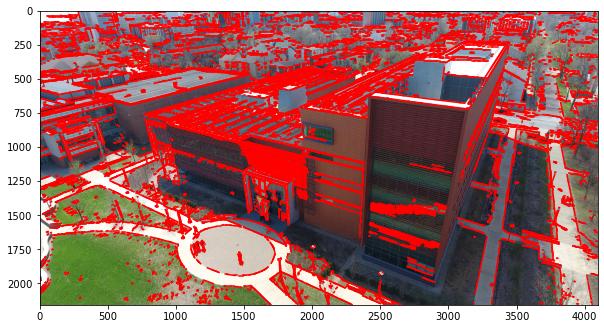

In [106]:
image_name = 'eceb.jpg'
image = io.imread(image_name)
edgelets1 = compute_edgelets(image, sigma=3)
vis_edgelets(image, edgelets1, figname='detected_edges.png')
# print("Rectifying {}".format(image_name))
# save_name = '.'.join(image_name.split('.')[:-1]) + 'warped.png'
# io.imsave(save_name, rectify_image(image_name, 4, algorithm='independent'))

<ipython-input-105-5c55fd083eb9>:101: RuntimeWarning: invalid value encountered in arccos
  theta = np.arccos(np.abs(cosine_theta))
<ipython-input-105-5c55fd083eb9>:268: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  est_model = np.linalg.lstsq(a, b)[0]
Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 814, in callit
    func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\_backend_tk.py", line 253, in idle_draw
    self.draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_t

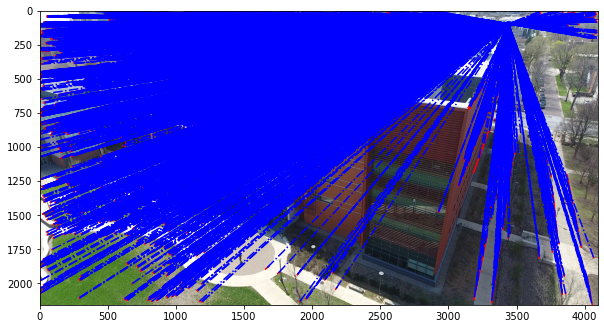

In [107]:
vp1 = ransac_vanishing_point(edgelets1, num_ransac_iter=2000, 
                             threshold_inlier=5)
vp1 = reestimate_model(vp1, edgelets1, threshold_reestimate=5)
vis_model(image, vp1, 'vp1.png') # Visualize the vanishing point model

<ipython-input-105-5c55fd083eb9>:101: RuntimeWarning: invalid value encountered in arccos
  theta = np.arccos(np.abs(cosine_theta))
<ipython-input-105-5c55fd083eb9>:268: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  est_model = np.linalg.lstsq(a, b)[0]
Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 814, in callit
    func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\_backend_tk.py", line 253, in idle_draw
    self.draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_t

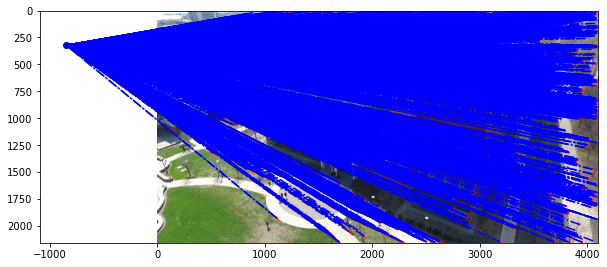

In [108]:
edgelets2 = remove_inliers(vp1, edgelets1, 10)
vp2 = ransac_vanishing_point(edgelets2, num_ransac_iter=2000,
                             threshold_inlier=5)
vp2 = reestimate_model(vp2, edgelets2, threshold_reestimate=5)
vis_model(image, vp2, 'vp2.png') # Visualize the vanishing point model

<ipython-input-105-5c55fd083eb9>:101: RuntimeWarning: invalid value encountered in arccos
  theta = np.arccos(np.abs(cosine_theta))
<ipython-input-105-5c55fd083eb9>:268: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  est_model = np.linalg.lstsq(a, b)[0]
Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 1892, in __call__
    return self.func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\tkinter\__init__.py", line 814, in callit
    func(*args)
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\_backend_tk.py", line 253, in idle_draw
    self.draw()
  File "C:\Users\12176\anaconda3\envs\hi\lib\site-packages\matplotlib\backends\backend_t

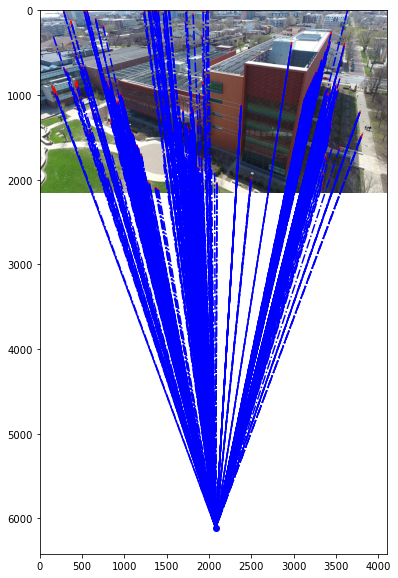

In [109]:
edgelets3 = remove_inliers(vp2, edgelets2, 3)
vp3 = ransac_vanishing_point(edgelets3, num_ransac_iter=2000,
                             threshold_inlier=5)
vp3 = reestimate_model(vp3, edgelets3, threshold_reestimate=5)
vis_model(image, vp3, 'vp3.png') # Visualize the vanishing point model

In [86]:
warped_img = compute_homography_and_warp(image, vp1, vp2, clip_factor=3)
save_name = '.'.join(image_name.split('.')[:-1]) + '_warped.png'
io.imsave(save_name, warped_img)

In [116]:
vpts_extra = np.vstack([vp1, vp2, vp3]).T
vpts_extra

array([[ 3.43994228e+03, -8.46674962e+02,  2.07763928e+03],
       [ 9.70499018e+01,  3.22863046e+02,  6.11341264e+03],
       [ 1.00000000e+00,  1.00000000e+00,  1.00000000e+00]])

In [117]:
R_extra = get_rotation_matrix(vpts_extra, K)
R_extra

array([[ 2.57559635e-04, -5.26326745e-04,  8.43758992e-06],
       [-1.86303679e-04, -1.45009597e-04,  9.13898045e-04],
       [ 9.99999949e-01,  9.99999851e-01,  9.99999582e-01]])

In [118]:
H_extra = get_homography(R_extra, K)
H_extra

array([[ 6.29056416e-04, -1.54830000e-04,  2.07653325e+03],
       [ 1.77473511e-05,  5.90414124e-05,  6.11330815e+03],
       [ 1.82868306e-07,  1.82868288e-07,  9.99424035e-01]])

In [119]:
im1 = io.imread('eceb.jpg').astype(float)
H, W, _ = im1.shape
homo = H_extra
def make_coordinates(W, H):
    x, y = np.meshgrid(np.linspace(0, W-1, W), np.linspace(0, H-1, H))
    x = x.reshape(*x.shape, 1)
    y = y.reshape(*y.shape, 1)
    ones = x - x + 1.
    return np.concatenate((x, y, ones), axis=-1).T
coordinates = make_coordinates(W, H)
projected = np.tensordot(np.linalg.inv(homo), coordinates, 1)
projected /= projected[2, :, :]
projected = projected[:2, :, :].astype(int)
x1 = projected[0, :, :]
y1 = projected[1, :, :]
minx, miny = min(0, x1.min()), min(0, y1.min())
maxx, maxy = max(W, x1.max()), max(H, y1.max())
print(minx, miny, maxx, maxy)
projected[0, :, :] += abs(minx)
projected[1, :, :] += abs(miny)
H1 = maxy - miny + 1
W1 = maxx - minx + 1
original = make_coordinates(W1, H1)
original[0, :, :] += minx
original[1, :, :] += miny
original = np.tensordot(homo, original, 1)
original /= original[-1, :, :]
original = original[:2, :, :].astype(int)
canvas = np.zeros((H1, W1, 3)) + 255.
canvas[abs(miny): abs(miny) + H, abs(minx): abs(minx) + W] = im2
for x in range(W1 - 1):
    for y in range(H1 - 1):
        x0, y0 = original[:, x, y]
        if x0 >= 0 and y0 >= 0 and x0 < W and y0 < H:
            canvas[y, x, :] = im1[y0, x0, :]
return canvas

-2147483648 -2147483648 2147462938 2147471590


<ipython-input-119-9463ac79d4ff>:21: RuntimeWarning: overflow encountered in long_scalars
  H1 = maxy - miny + 1
<ipython-input-119-9463ac79d4ff>:22: RuntimeWarning: overflow encountered in long_scalars
  W1 = maxx - minx + 1


ValueError: Number of samples, -20709, must be non-negative.